In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from sklearn.preprocessing import MultiLabelBinarizer
from datetime import datetime

import glob
import os

In [2]:
path_central_novice = './CentralR-N'
all_files_central_novice = sorted(glob.glob(os.path.join(path_central_novice, "*.json")))

central = []
for f in all_files_central_novice:
    df = pd.read_json(f)
    df['logDate'] = f[25:35]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    central.append(df)
    
central_novice = pd.concat(central, ignore_index=True)
central_novice['region'] = 'Central'

path_east_novice = './EastR-N'
all_files_east_novice = sorted(glob.glob(os.path.join(path_east_novice, "*.json")))

east = []
for f in all_files_east_novice:
    df = pd.read_json(f)
    df['logDate'] = f[22:32]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    east.append(df)
    
east_novice = pd.concat(east, ignore_index=True)
east_novice['region'] = 'East'

novice = pd.concat(([central_novice, east_novice]), ignore_index=True)
X = novice.drop(['annId', 'urls', 'siteIds', 'animeScore', 'selfAnswer', 'fromList', 'gameMode', 'correct'], axis=1).copy()

def find_n_correct(players):
    i = 0
    for player in players:
        if player['correct'] == True:
            i += 1
    return i

def find_gt(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x]
    return np.array(guess_times).mean()

def find_gt_filter(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x and x['guessTime'] < 15000]
    return np.array(guess_times).mean()

def find_ng(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_ng_filter(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x and x['guessTime'] < 15000:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_cgt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == True)])
    return np.array(guess_times).mean()

def find_igt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == False)])
    return np.array(guess_times).mean()

def find_scores(players):
    scores = np.zeros(len(players))
    for i, x in enumerate(players):
        scores[i] = x['score']
    return scores

def shortest_answer_length(answers):
    return len(min(answers, key=len))

def find_shortest_answer(answers):
    return min(answers, key=len)

def fastest_guess(players):
    guess_times = np.array([x['guessTime'] if 'guessTime' in x else 20000 for x in players])
    return np.min(guess_times)

def fastest_correct_guess(players):
    guess_times = np.array([x['guessTime'] if ('guessTime' in x and x['correct'] == True) else 20000 for x in players])
    return np.min(guess_times)

X['avgGuessTime'] = X['players'].apply(find_gt)
X['avgGuessTime_15k'] = X['players'].apply(find_gt_filter)
X['n_correctGuess'] = X['players'].apply(find_n_correct)
X['n_noGuess'] = X['players'].apply(find_ng)
X['n_noGuess_15k'] = X['players'].apply(find_ng_filter)
X['p_noGuess'] = X['n_noGuess']/X['activePlayers'] *100
X['p_noGuess_15k'] = X['n_noGuess_15k']/X['activePlayers'] *100
X['p_correctGuess'] = X['n_correctGuess']/X['activePlayers']*100
X['avgGuessTime_c'] = X['players'].apply(find_cgt)
X['avgGuessTime_i'] = X['players'].apply(find_igt)
X['type_noNumber'] = X['type'].str.split().str[0]
X['samplePercent'] = X['startSample']/X['videoLength']
X['AiredDate'] = X['vintage'].replace({'Winter': '1', 'Spring': '4', 'Summer': '7', 'Fall': '10'}, regex=True)
X['AiredDate'] = pd.to_datetime(X['AiredDate'], format='%m %Y')
X['shortest_length'] = X['altAnswers'].apply(shortest_answer_length)
X['shortest_answer'] = X['altAnswers'].apply(find_shortest_answer)
X['fastest'] = X['players'].apply(fastest_guess)
X['fastest_correct'] = X['players'].apply(fastest_correct_guess)

n_games = X.shape[0]/45
songs_played = X.shape[0]
guess_rate = X['p_correctGuess'].mean()
guess_time = X['avgGuessTime'].mean()
no_guess_rate = X['p_noGuess'].mean()
diff = X['difficulty'].mean()

op = X.loc[X['type_noNumber'] == 'Opening']
op_played = op.shape[0]
op_rate = op['p_correctGuess'].mean()
op_diff = op['difficulty'].mean()

ed = X.loc[X['type_noNumber'] == 'Ending']
ed_played = ed.shape[0]
ed_rate = ed['p_correctGuess'].mean()
ed_diff = ed['difficulty'].mean()

ins = X.loc[X['type_noNumber'] == 'Insert']
in_played = ins.shape[0]
in_rate = ins['p_correctGuess'].mean()
in_diff = ins['difficulty'].mean()

last_song = pd.DataFrame(X.loc[X['songNumber'] == 45]).reset_index(drop=True)
last_song['Scores'] = last_song['players'].apply(find_scores)

finalScores = np.concatenate(last_song['Scores'].values).astype(int)
end_mean = finalScores.mean()
end_std = finalScores.std()
end_max = finalScores.max()

mlb = MultiLabelBinarizer()
s = X['tags']
dummy = pd.DataFrame(mlb.fit_transform(s), columns=mlb.classes_, index=X.index, dtype=np.bool_)
X = pd.concat([X, dummy], axis=1)

mlb2 = MultiLabelBinarizer()
s = X['genre']
dummy = pd.DataFrame(mlb2.fit_transform(s), columns=mlb2.classes_, index=X.index, dtype=np.bool_)
X = pd.concat([X, dummy], axis=1)

X = X.drop(['tags', 'genre'], axis=1)

genres = X[mlb2.classes_].sum().sort_values(ascending=False)
g_perc = pd.Series(index=mlb2.classes_, dtype='float64')
for genre in mlb2.classes_:
    g_perc[genre] = X.loc[X[genre] == 1]['p_correctGuess'].mean()
genres = pd.concat([genres, g_perc], axis=1)
genres.columns = ['Count', 'Guess rate']
genres = genres.sort_values(by='Guess rate', ascending=False)

tags = X[mlb.classes_].sum().sort_values(ascending=False)
t_perc = pd.Series(index=mlb.classes_, dtype='float64')
for tag in mlb.classes_:
    t_perc[tag] = X.loc[X[tag] == 1]['p_correctGuess'].mean()
tags = pd.concat([tags, t_perc], axis=1)
tags.columns = ['Count', 'Guess rate']
tags = tags.sort_values(by='Count', ascending=False).head(30).sort_values(by='Guess rate', ascending=False)

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1197/2108070730.py:75: RuntimeWarning: Mean of empty slice.
  return np.array(guess_times).mean()
/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1197/2108070730.py:79: RuntimeWarning: Mean of empty slice.
  return np.array(guess_times).mean()


In [3]:
general_table = [
    ['Games played', n_games],
    ['Songs played', songs_played],
    ['Correct guess rate (%)', '{:.2f}'.format(guess_rate)],
    ['Average difficulty', '{:.2f}'.format(diff)],
    ['Average guess time (s)', '{:.2f}'.format(guess_time/1000)],
    ['No guess rate (%)', '{:.2f}'.format(no_guess_rate)]
]
print(tabulate(general_table, tablefmt='fancy_grid'))

types_table = {
    'Openings': [op_played, op_rate, op_diff],
    'Endings': [ed_played, ed_rate, ed_diff],
    'Inserts': [in_played, in_rate, in_diff]
}
print(tabulate(types_table, tablefmt='fancy_grid', headers='keys', showindex=[
    'Songs played', 'Correct guess rate (%)', 'Average difficulty']
              ))

ends_table = {
    'Final score': ['{:.2f}'.format(end_mean), '{:.2f}'.format(end_std), end_max]
}
print(tabulate(ends_table, tablefmt='fancy_grid', headers='keys', showindex=[
    'Mean', 'STD', 'Highest']
              ))

╒════════════════════════╤═════════╕
│ Games played           │  158    │
├────────────────────────┼─────────┤
│ Songs played           │ 7110    │
├────────────────────────┼─────────┤
│ Correct guess rate (%) │   40.51 │
├────────────────────────┼─────────┤
│ Average difficulty     │   46.1  │
├────────────────────────┼─────────┤
│ Average guess time (s) │   13.22 │
├────────────────────────┼─────────┤
│ No guess rate (%)      │   27.32 │
╘════════════════════════╧═════════╛
╒════════════════════════╤════════════╤═══════════╤═══════════╕
│                        │   Openings │   Endings │   Inserts │
╞════════════════════════╪════════════╪═══════════╪═══════════╡
│ Songs played           │  4266      │ 1580      │ 1264      │
├────────────────────────┼────────────┼───────────┼───────────┤
│ Correct guess rate (%) │    46.3931 │   32.4005 │   30.8174 │
├────────────────────────┼────────────┼───────────┼───────────┤
│ Average difficulty     │    50.1393 │   40.2303 │   39.8124 │
╘══════

In [4]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [5]:
def find_jp(names):
    if 'romaji' in names:
        name = names['romaji']
    else:
        raise Exception('No jp name')
    return name
X['anime_jp'] = X['anime'].apply(find_jp)

lbs = {'difficulty':'Difficulty',
      'artist':'Artist',
      'name':'Song',
      'p_correctGuess':'Correct percent',
      'p_noGuess':'No guess percent',
      'anime_jp':'Anime',
      'avgGuessTime':'Average guess time',
      'AiredDate': 'Aired date',
      'avgGuessTime_c':'Correct avg. guess time',
      'avgGuessTime_i':'Incorrect avg. guess time',
      'type_noNumber':'Song type'}

hover_dt = {'artist':True,
           'name':True,
           'anime_jp':True,
           'avgGuessTime':True,
           'difficulty':':.1f',
           'p_noGuess':':.1f',
           'p_correctGuess':':.1f',
           'avgGuessTime':':.1f',
           'avgGuessTime_c':':.1f',
           'avgGuessTime_i':':.1f',}

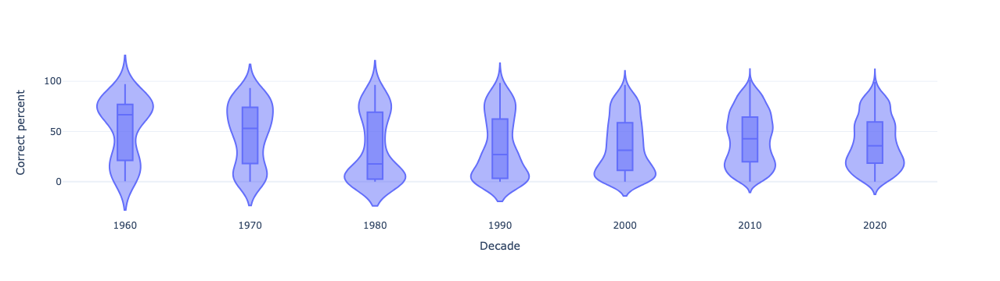

In [6]:
X['Decade'] = X['AiredDate'].dt.year//10*10 
px.violin(X, x='Decade', y='p_correctGuess', template='plotly_white', box=True, labels=lbs)

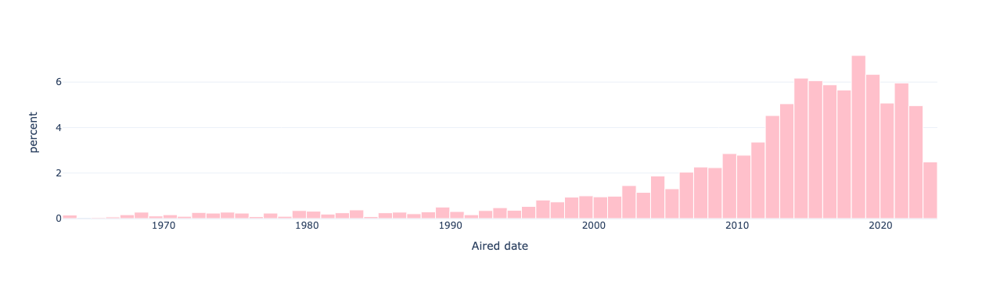

In [7]:
fig = px.histogram(X, x='AiredDate', labels=lbs, template='plotly_white', color_discrete_sequence=['pink'], histnorm='percent')
fig.update_traces(marker_line_width=1, marker_line_color="white")
fig.show()

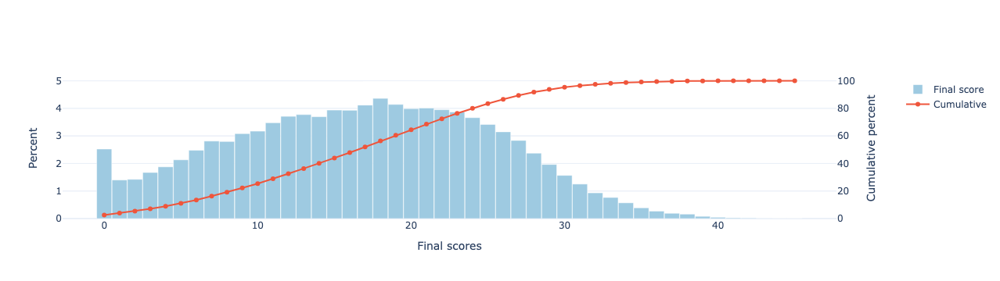

In [8]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

hist = np.histogram(finalScores, bins=np.arange(47)-0.01)[0]
hist_density = np.histogram(finalScores, bins=np.arange(47)-0.01, density=True)[0]*100
fig.add_trace(
    go.Bar(x=np.arange(0, 46), y=hist_density, name='Final score', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(158,202,225)')
fig.add_trace(
    go.Scatter(x=np.arange(0, 46), y=hist_density.cumsum() ,mode='lines+markers', name='Cumulative'),
    secondary_y=True,
)
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Percent'),
        side='left',
        range=[0, 5.1],
    ),
    yaxis2=dict(
        title=dict(text='Cumulative percent'),
        side='right',
        range=[0, 102],
        overlaying='y',
        tickmode='auto',
    ),)
fig.update_xaxes(title_text='Final scores')
fig

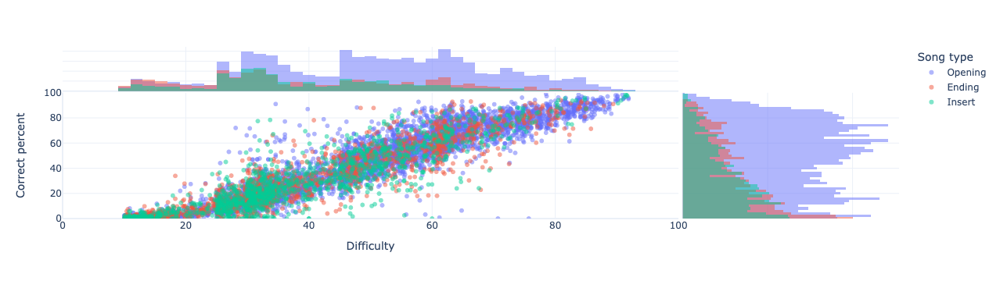

In [9]:
px.scatter(
        X,
        x='difficulty',
        y='p_correctGuess',
        color='type_noNumber',
        marginal_x='histogram', 
        marginal_y='histogram',
        hover_data=hover_dt,
        labels=lbs,
        trendline=None,
        template='plotly_white',
        range_x=[0, 100],
        range_y=[0, 100],
        opacity=0.5
        )

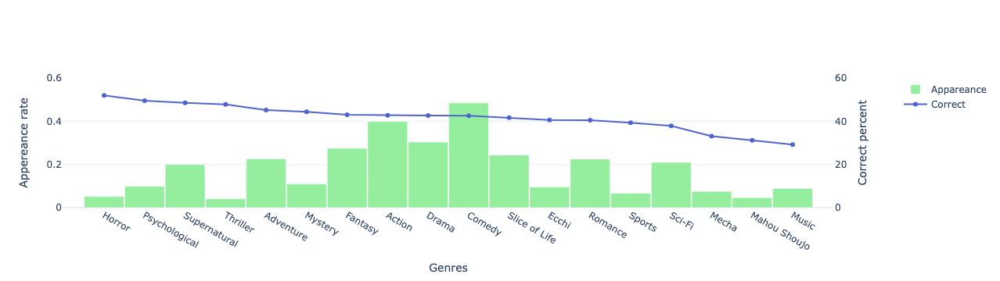

In [10]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Bar(x=genres['Count'].keys(), y=genres['Count']/songs_played, name='Appareance', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(149,237,158)')
fig.add_trace(
    go.Scatter(x=genres['Count'].keys(), y=genres['Guess rate'], mode='lines+markers', name='Correct'),
    secondary_y=True,
)
fig.update_traces(marker_color='rgb(78, 100, 207)', selector=dict(type='scatter'))
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Appereance rate'),
        side='left',
        range=[0, 0.6],
    ),
    yaxis2=dict(
        title=dict(text='Correct percent'),
        side='right',
        range=[0, 60],
        overlaying='y',
    ),)
fig.update_xaxes(title_text='Genres')
fig

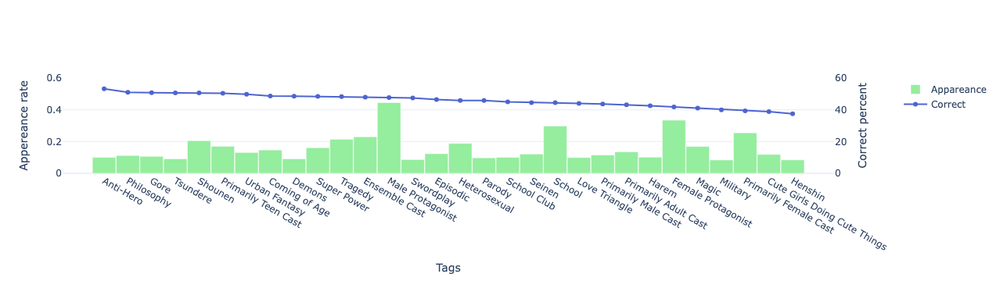

In [11]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Bar(x=tags['Count'].keys(), y=tags['Count']/songs_played, name='Appareance', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(149,237,158)')
fig.add_trace(
    go.Scatter(x=tags['Count'].keys(), y=tags['Guess rate'], mode='lines+markers', name='Correct'),
    secondary_y=True,
)
fig.update_traces(marker_color='rgb(78, 100, 207)', selector=dict(type='scatter'))
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Appereance rate'),
        side='left',
        range=[0, 0.6],
    ),
    yaxis2=dict(
        title=dict(text='Correct percent'),
        side='right',
        range=[0, 60],
        overlaying='y',
    ),)
fig.update_xaxes(title_text='Tags')
fig

In [12]:
def find_gr_by_gt(players, threshold, diff):
    c_guess_rate = np.array([])
    for i, x in enumerate(players):
        if x['active'] == False:
            continue
        if 'guessTime' not in x:
            continue
        if x['guessTime'] > threshold:
            continue
        if x['guessTime'] < threshold-diff:
            continue
        if x['correct']:
            c_guess_rate = np.append(c_guess_rate, 1)
        else:
            c_guess_rate = np.append(c_guess_rate, 0)
    return c_guess_rate.mean()

In [13]:
thresholds = [1000*x for x in range(1, 21)]
thresholds_p = [1000*x for x in range(1, 21)]
for i, t in enumerate(thresholds):
    thresholds_p[i] = pd.Series(X['players'].apply(find_gr_by_gt, args=[t, 1000]), name=f's{t}')

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1197/418440418.py:16: RuntimeWarning:

Mean of empty slice.



In [14]:
guess_gt = pd.DataFrame(thresholds_p).transpose()

In [15]:
m_guess_gt = guess_gt.mean(axis=0)

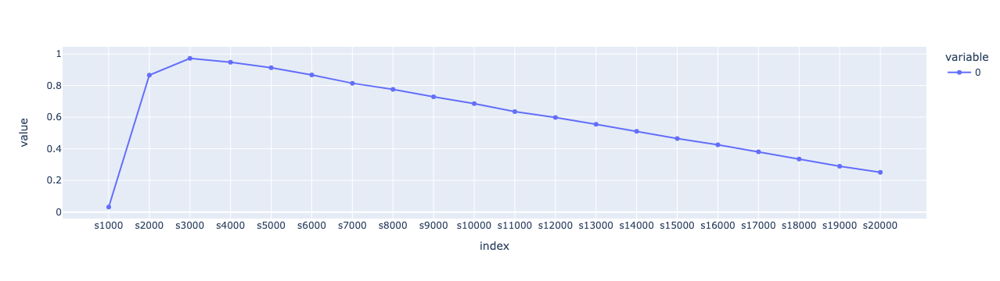

In [16]:
px.line(m_guess_gt, markers=True)

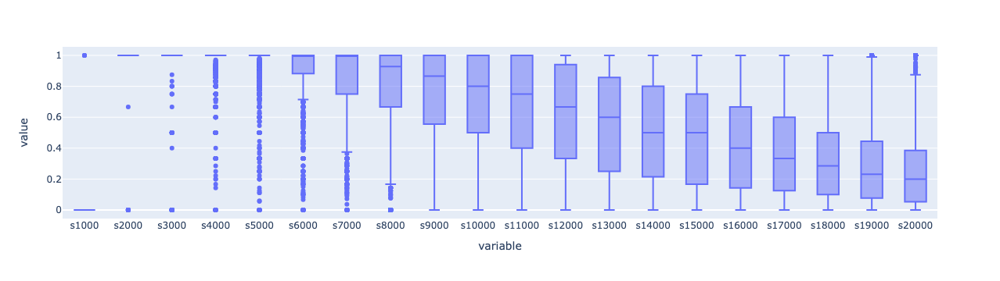

In [17]:
px.box(guess_gt)

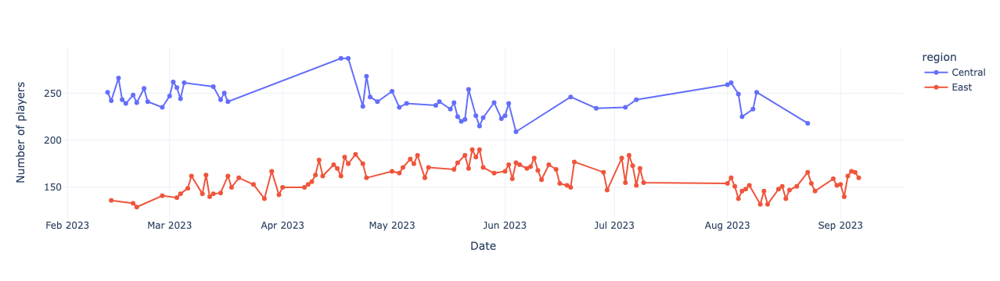

In [18]:
px.line(last_song, x='logDate', y='totalPlayers', markers=True, color='region',
        template='plotly_white',
        labels={'totalPlayers':'Number of players', 'logDate':'Date'})

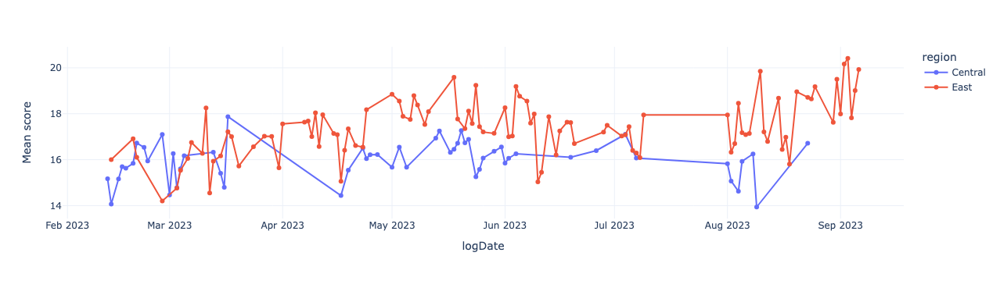

In [19]:
px.line(last_song, x='logDate', y=last_song['Scores'].apply(np.mean), markers=True, color='region',
        template='plotly_white',
        labels={'y':'Mean score', 'index':'Game'})

In [20]:
def add_index(players, index):
    for player in players:
        player['songIndex'] = index
    return players
X['songIndex'] = np.arange(X.shape[0])

In [21]:
X['players_id'] = X.apply(lambda x: add_index(x['players'], x['songIndex']), axis=1)

In [22]:
def flatten(l):
    return [item for sublist in l for item in sublist]

In [23]:
flat = pd.DataFrame(flatten(X['players_id'].to_list()))
flat = flat.loc[flat['active'] == True]
flat = flat.drop(['answer','correctGuesses', 'active', 'positionSlot'], axis=1).astype({'score':np.uint8,
                                                                                 'position':np.uint16,
                                                                                 'songIndex':np.uint32,
                                                                                 'guessTime':np.float32}).set_index('songIndex')
flat.info()

<class 'pandas.core.frame.DataFrame'>
UInt64Index: 1241384 entries, 0 to 7109
Data columns (total 5 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   name       1241384 non-null  object 
 1   score      1241384 non-null  uint8  
 2   correct    1241384 non-null  bool   
 3   guessTime  898613 non-null   float32
 4   position   1241384 non-null  uint16 
dtypes: bool(1), float32(1), object(1), uint16(1), uint8(1)
memory usage: 28.4+ MB


In [56]:
flat = pd.read_parquet('./players.parquet')
flat.info()

<class 'pandas.core.frame.DataFrame'>
UInt64Index: 1370559 entries, 0 to 9449
Data columns (total 5 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   name       1370559 non-null  object 
 1   score      1370559 non-null  uint8  
 2   correct    1370559 non-null  bool   
 3   guessTime  978514 non-null   float32
 4   position   1370559 non-null  uint16 
dtypes: bool(1), float32(1), object(1), uint16(1), uint8(1)
memory usage: 31.4+ MB


In [57]:
dat = pd.read_parquet('./data.parquet')

In [58]:
user = 'VnSoul'
slice_flat = flat.loc[flat['name'] == user]
slice_flat = slice_flat.drop('name', axis=1)

In [69]:
dat.join(slice_flat).dropna(subset='score')

0      2023-02-12
1      2023-02-12
2      2023-02-12
3      2023-02-12
4      2023-02-12
          ...    
9445   2023-04-28
9446   2023-04-28
9447   2023-04-28
9448   2023-04-28
9449   2023-04-28
Name: logDate, Length: 3997, dtype: datetime64[ns]